In [ ]:
#Import libraries
import os
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt

In [ ]:
# Enable GPU memory growth if using GPU
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)

In [ ]:
# =============================================================================
# 1. Data Loading and Preprocessing
# =============================================================================
def load_and_preprocess_images(image_folder, target_size=(256, 256)):

    images = []
    for filename in os.listdir(image_folder):
        img_path = os.path.join(image_folder, filename)
        img = cv2.imread(img_path)
        if img is None:
            continue  # Skip non-image files

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        # Resize to target dimensions
        img = cv2.resize(img, target_size)
        # Normalize pixel values to [0,1]
        img = img.astype('float32') / 255.0

        images.append(img)
    return np.array(images)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:


# Replace these with the correct paths on your system.
train_path = "/content/drive/My Drive/Colab Notebooks/sTrain"
test_path = "/content/drive/My Drive/Colab Notebooks/stest"

# Load images
train_images = load_and_preprocess_images(train_path)
test_images  = load_and_preprocess_images(test_path)

print(f"Train images shape: {train_images.shape}")
print(f"Test images shape: {test_images.shape}")

Train images shape: (75, 256, 256, 3)
Test images shape: (25, 256, 256, 3)


In [ ]:
# =============================================================================
# 2. Frequency Transformation Functions: DCT and IDCT
# =============================================================================
def dct2d(x):

    x = tf.transpose(x, perm=[0, 3, 1, 2])
    x = tf.signal.dct(x, type=2, norm='ortho', axis=-1)
    x = tf.transpose(x, perm=[0, 1, 3, 2])
    x = tf.signal.dct(x, type=2, norm='ortho', axis=-1)
    x = tf.transpose(x, perm=[0, 1, 3, 2])
    x = tf.transpose(x, perm=[0, 2, 3, 1])
    return x

def idct2d(x):

    x = tf.transpose(x, perm=[0, 3, 1, 2])
    x = tf.signal.idct(x, type=2, norm='ortho', axis=-1)
    x = tf.transpose(x, perm=[0, 1, 3, 2])
    x = tf.signal.idct(x, type=2, norm='ortho', axis=-1)
    x = tf.transpose(x, perm=[0, 1, 3, 2])
    x = tf.transpose(x, perm=[0, 2, 3, 1])
    return x


In [ ]:
# =============================================================================
# 3. Residual Block Definition
# =============================================================================
def res_block(x, filters, kernel_size=3):

    shortcut = x
    if x.shape[-1] != filters:
        shortcut = layers.Conv2D(filters, (1, 1), padding='same')(shortcut)
    x = layers.Conv2D(filters, kernel_size, padding='same')(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(filters, kernel_size, padding='same')(x)
    x = layers.add([shortcut, x])
    x = layers.Activation('relu')(x)
    return x

In [ ]:
# =============================================================================
# 4. Autoencoder Model with Frequency Branch and Skip Connections
# =============================================================================
def build_autoencoder_modified(input_shape=(256, 256, 3)):

    inputs = layers.Input(shape=input_shape)


    c1 = res_block(inputs, 64)
    p1 = layers.MaxPooling2D((2, 2))(c1)
    c2 = res_block(p1, 128)
    p2 = layers.MaxPooling2D((2, 2))(c2)
    c3 = res_block(p2, 256)
    p3 = layers.MaxPooling2D((2, 2))(c3)
    c4 = res_block(p3, 512)
    p4 = layers.MaxPooling2D((2, 2))(c4)
    bn = res_block(p4, 1024)


    dct_bn = layers.Lambda(dct2d, name="dct_layer")(bn)
    x = layers.Conv2D(512, kernel_size=3, padding='same', activation='relu')(dct_bn)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Conv2D(256, kernel_size=3, padding='same', activation='relu')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Conv2D(128, kernel_size=3, padding='same', activation='relu')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Flatten()(x)


    latent = layers.Dense(64, activation='relu', name='latent')(x)


    x = layers.Dense(2 * 2 * 128, activation='relu')(latent)
    x = layers.Reshape((2, 2, 128))(x)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2D(128, kernel_size=3, padding='same', activation='relu')(x)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2D(256, kernel_size=3, padding='same', activation='relu')(x)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2D(512, kernel_size=3, padding='same', activation='relu')(x)
    x = layers.Conv2D(1024, kernel_size=3, padding='same', activation='relu')(x)


    idct_bn = layers.Lambda(idct2d, name="idct_layer")(x)


    u4 = layers.UpSampling2D((2, 2))(idct_bn)
    u4 = layers.Conv2D(512, (2, 2), activation='relu', padding='same')(u4)
    merge4 = layers.concatenate([c4, u4], axis=-1)
    c5 = res_block(merge4, 512)

    u3 = layers.UpSampling2D((2, 2))(c5)
    u3 = layers.Conv2D(256, (2, 2), activation='relu', padding='same')(u3)
    merge3 = layers.concatenate([c3, u3], axis=-1)
    c6 = res_block(merge3, 256)

    u2 = layers.UpSampling2D((2, 2))(c6)
    u2 = layers.Conv2D(128, (2, 2), activation='relu', padding='same')(u2)
    merge2 = layers.concatenate([c2, u2], axis=-1)
    c7 = res_block(merge2, 128)

    u1 = layers.UpSampling2D((2, 2))(c7)
    u1 = layers.Conv2D(64, (2, 2), activation='relu', padding='same')(u1)
    merge1 = layers.concatenate([c1, u1], axis=-1)
    c8 = res_block(merge1, 64)

    outputs = layers.Conv2D(3, (1, 1), activation='sigmoid')(c8)

    model = models.Model(inputs, outputs, name="CompressionAutoencoder")
    return model

In [ ]:
# =============================================================================
# 6. Main: Build, Compile, Train, Evaluate, and Display Compression Details
# =============================================================================
if __name__ == '__main__':
    # Build and compile the autoencoder
    autoencoder = build_autoencoder_modified(input_shape=(256, 256, 3))
    autoencoder.compile(optimizer='adam', loss='mean_squared_error')
    autoencoder.summary()

    # Train the model (adjust epochs and batch_size as needed)
    history = autoencoder.fit(train_images, train_images,
                              epochs=100,
                              batch_size=16,
                              validation_data=(test_images, test_images))

    # Get reconstructed images from the autoencoder
    reconstructed_images = autoencoder.predict(test_images)

Model: "CompressionAutoencoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_40 (Conv2D)        │ (None, 256, 256, 64)   │          1,792 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_18             │ (None, 256, 256, 64)   │              0 │ conv2d_40[0][0]        │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_39 (Conv2D)        │ (None, 256, 256, 64)   │            256 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_41 (Conv2D)        │ (None, 256, 256, 64)   │         36,928 │ activation_18[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_9 (Add)               │ (None, 256, 256, 64)   │              0 │ conv2d_39[0][0],       │
│                           │                        │                │ conv2d_41[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_19             │ (None, 256, 256, 64)   │              0 │ add_9[0][0]            │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_7           │ (None, 128, 128, 64)   │              0 │ activation_19[0][0]    │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_43 (Conv2D)        │ (None, 128, 128, 128)  │         73,856 │ max_pooling2d_7[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_20             │ (None, 128, 128, 128)  │              0 │ conv2d_43[0][0]        │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_42 (Conv2D)        │ (None, 128, 128, 128)  │          8,320 │ max_pooling2d_7[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_44 (Conv2D)        │ (None, 128, 128, 128)  │        147,584 │ activation_20[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_10 (Add)              │ (None, 128, 128, 128)  │              0 │ conv2d_42[0][0],       │
│                           │                        │                │ conv2d_44[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_21             │ (None, 128, 128, 128)  │              0 │ add_10[0][0]           │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_8           │ (None, 64, 64, 128)    │              0 │ activation_21[0][0]    │
│ (MaxPooling2D)            │                        │                │                        │
├──────────────────────

 Total params: 45,030,339 (171.78 MB)

 Trainable params: 45,030,339 (171.78 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 33s 3s/step - loss: 0.0797 - val_loss: 0.0690
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0611 - val_loss: 0.0642
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 142ms/step - loss: 0.0443 - val_loss: 0.0445
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step - loss: 0.0307 - val_loss: 0.0206
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 142ms/step - loss: 0.0170 - val_loss: 0.0142
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 142ms/step - loss: 0.0103 - val_loss: 0.0107
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 142ms/step - loss: 0.0067 - val_loss: 0.0084
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0049 - val_loss: 0.0077
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0043 - val_loss: 0.0057
Epoch 10/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 142ms/step - loss: 0.0034 - val_loss: 0.0052
Epoch 11/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0033 - val_loss: 0.0045
Epoch 12/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.002

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


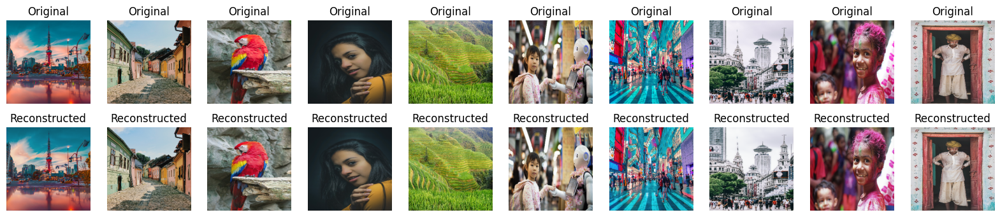

In [ ]:
def plot_original_vs_reconstructed(original, reconstructed, num_images=10):
    """
    Displays a side-by-side comparison of original and reconstructed images.
    """
    plt.figure(figsize=(20, 4))
    for i in range(num_images):
        # Original image
        ax = plt.subplot(2, num_images, i + 1)
        plt.imshow(original[i])
        plt.title("Original")
        plt.axis('off')
        # Reconstructed image
        ax = plt.subplot(2, num_images, i + 1 + num_images)
        plt.imshow(reconstructed[i])
        plt.title("Reconstructed")
        plt.axis('off')
    plt.show()
# Use the trained autoencoder to reconstruct the test images.
reconstructed_images = autoencoder.predict(test_images)

# Display a comparison of original vs. reconstructed images.
plot_original_vs_reconstructed(test_images, reconstructed_images, num_images=10)

In [ ]:
# -------------------------------------------------------------------------
# Extract the latent (compressed) representation using an auxiliary encoder model.
# This is the data that would be stored or transmitted.
# -------------------------------------------------------------------------
encoder = models.Model(autoencoder.input, autoencoder.get_layer('latent').output)
latent_codes = encoder.predict(test_images)

raw_bytes_per_image = latent_codes.shape[1] * 4

quantized_bytes_per_image = latent_codes.shape[1] * 1
print("\nLatent Representation Size:")
print("  Raw (float32) per image:    {} bytes".format(raw_bytes_per_image))
print("  Quantized (8-bit) per image:  {} bytes".format(quantized_bytes_per_image))


original_bytes_per_image = 256 * 256 * 3
print("\nOriginal Full Image Size (raw): {} bytes per image".format(original_bytes_per_image))


mse_value = np.mean((test_images - reconstructed_images) ** 2)
psnr_value = tf.image.psnr(test_images, reconstructed_images, max_val=1.0).numpy().mean()
ssim_value = tf.image.ssim(test_images, reconstructed_images, max_val=1.0).numpy().mean()
msssim_value = tf.image.ssim_multiscale(test_images, reconstructed_images, max_val=1.0).numpy().mean()

print("\nReconstruction Quality Metrics:")
print("--------------------------------")
print("MSE:         ", mse_value)
print("PSNR:        ", psnr_value, "dB")
print("SSIM:        ", ssim_value)
print("MS-SSIM:     ", msssim_value)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 905ms/step

Latent Representation Size:
  Raw (float32) per image:    256 bytes
  Quantized (8-bit) per image:  64 bytes

Original Full Image Size (raw): 196608 bytes per image

Reconstruction Quality Metrics:
--------------------------------
MSE:          0.0005453813
PSNR:         34.260796 dB
SSIM:         0.97686285
MS-SSIM:      0.9955163


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


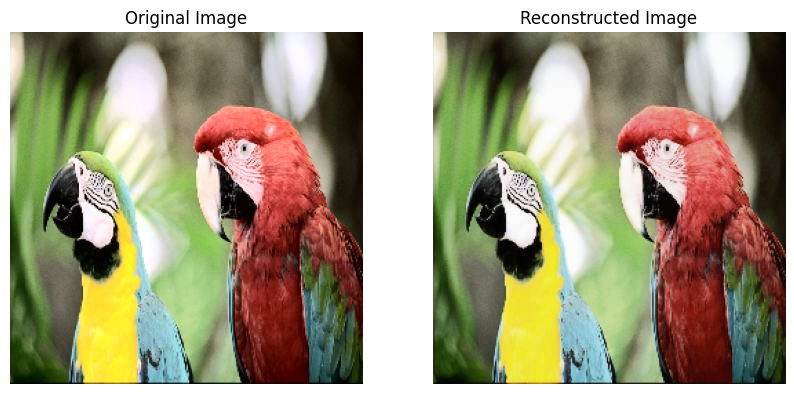

Size of original image (raw array) in KB: 768.0
Size of reconstructed image (raw array) in KB: 768.0
Compression Ratio: 1.00
Percentage Reduction: 0.00%
Saved WebP file size: 12.087890625 KB


In [ ]:
# ------------------------------
# loads a single image, preprocesses it (including histogram equalization), passes it through an autoencoder, visualizes the original and reconstructed images,
# and saves the reconstructed image in WebP format.
# -----------------------------

import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt


# ---------------------------
# Helper Function: Load and Preprocess a Single Image
# ---------------------------
def load_and_preprocess_image(image_path, target_size=(256, 256)):
    """
    Loads a single image from the given path, converts it to RGB, resizes it to target_size,
    normalizes the pixel values to [0,1], and applies histogram equalization on the luminance channel.
    """
    # Read image using OpenCV (reads as BGR)
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError("Image not found or unable to load: " + image_path)

    # Convert from BGR to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Resize image
    img = cv2.resize(img, target_size)
    # Normalize to [0,1]
    img = img.astype('float32') / 255.0

    # ----- Histogram Equalization on the Y channel -----
    img_8bit = (img * 255).astype(np.uint8)
    img_yuv = cv2.cvtColor(img_8bit, cv2.COLOR_RGB2YUV)
    img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])
    img_eq = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2RGB)
    img_eq = img_eq.astype('float32') / 255.0
    # ----------------------------------------------------
    return img_eq

# ---------------------------
# Paths for the Single Image and Output Directory
# ---------------------------

single_image_path = "/content/drive/My Drive/Colab Notebooks/KODAK/DataSet-Kodak/kodim23.png"
output_dir = "/content/drive/My Drive/Colab Notebooks/KODAK/Output/kodim23_WebpCompressed"

os.makedirs(output_dir, exist_ok=True)

# ---------------------------
# Load and Preprocess the Single Image
# ---------------------------
single_image = load_and_preprocess_image(single_image_path, target_size=(256, 256))

# ---------------------------
# Pass the Image through the Autoencoder
# ---------------------------
# Expand dims to create a batch (model.predict expects a batch dimension)
single_image_batch = np.expand_dims(single_image, axis=0)

# Predict the reconstruction using your autoencoder
reconstructed_batch = autoencoder.predict(single_image_batch)
# Remove the batch dimension to get a single image
reconstructed_image = reconstructed_batch[0]

# ---------------------------
# Display the Original and Reconstructed Images Side by Side
# ---------------------------
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(single_image)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image)
plt.title("Reconstructed Image")
plt.axis("off")
plt.show()

# ---------------------------
# Print Memory Size Comparison (Raw NumPy Arrays)
# ---------------------------
original_size_kb = single_image.nbytes / 1024
reconstructed_size_kb = reconstructed_image.nbytes / 1024

# Compute Compression Ratio
compression_ratio = original_size_kb / reconstructed_size_kb if reconstructed_size_kb != 0 else float('inf')

# Compute Percentage Reduction
percentage_reduction = ((original_size_kb - reconstructed_size_kb) / original_size_kb) * 100 if original_size_kb != 0 else 0


print("Size of original image (raw array) in KB:", original_size_kb)
print("Size of reconstructed image (raw array) in KB:", reconstructed_size_kb)

print("Compression Ratio: {:.2f}".format(compression_ratio))
print("Percentage Reduction: {:.2f}%".format(percentage_reduction))


# ---------------------------
# Save the Reconstructed Image as WebP in Google Drive
# ---------------------------
# Set the desired WebP quality (0-100; lower means more compression)
webp_quality = 80

# Convert the reconstructed image from [0,1] float to 8-bit unsigned integer
img_uint8 = (reconstructed_image * 255).astype(np.uint8)

# Convert from RGB to BGR (OpenCV uses BGR)
img_bgr = cv2.cvtColor(img_uint8, cv2.COLOR_RGB2BGR)

# Build the output filename for the WebP image
output_filename = os.path.join(output_dir, "reconstructed_image.webp")

# Save the image in WebP format with the specified quality
cv2.imwrite(output_filename, img_bgr, [int(cv2.IMWRITE_WEBP_QUALITY), webp_quality])

# Get and print the saved file size in KB
saved_file_size_kb = os.path.getsize(output_filename) / 1024
print("Saved WebP file size:", saved_file_size_kb, "KB")


Successfully converted: /content/drive/My Drive/Colab Notebooks/KODAK/DataSet-Kodak/kodim23.png -> /content/drive/My Drive/Colab Notebooks/KODAK/DataSet-Kodak/kodim23.jpg
PNG file size: 544.53 KB
JPEG file size: 75.52 KB
Compression Ratio (PNG / JPEG): 7.21
PSNR (PNG vs JPEG): 39.64 dB
MSSIM (PNG vs JPEG): 0.9609
Plot saved to: /content/drive/My Drive/Colab Notebooks/KODAK/Output/comparison_plot.png


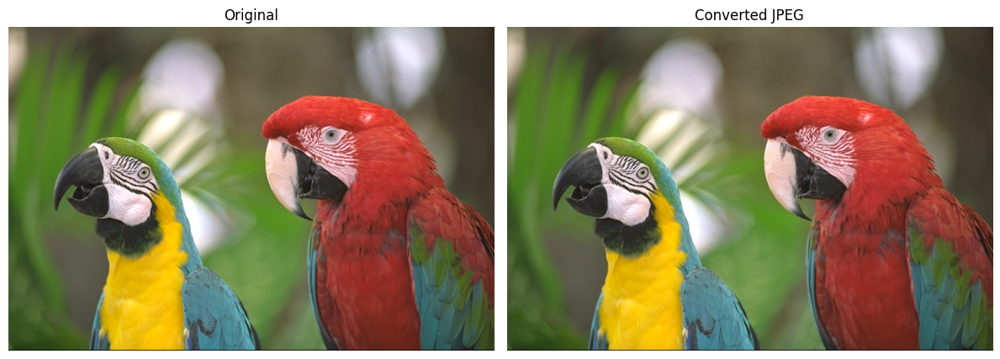

In [ ]:
import os
from PIL import Image
import numpy as np
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
import matplotlib.pyplot as plt

def convert_png_to_jpeg(image_path, quality=90, plot_save_path=None):
    # Split the image path into base and extension
    base, _ = os.path.splitext(image_path)
    jpeg_path = base + ".jpg"

    try:
        # Open the original PNG image
        with Image.open(image_path) as img:
            # If the image has transparency, paste it onto a white background
            if img.mode in ("RGBA", "LA") or (img.mode == "P" and "transparency" in img.info):
                background = Image.new("RGB", img.size, (255, 255, 255))
                if img.mode == "RGBA":
                    background.paste(img, mask=img.split()[3])
                else:
                    background.paste(img)
                img = background
            else:
                # Ensure the image is in RGB mode
                img = img.convert("RGB")

            # Save the image in JPEG format with the desired quality
            img.save(jpeg_path, "JPEG", quality=quality)
        print(f"Successfully converted: {image_path} -> {jpeg_path}")

        # Get file sizes in bytes
        png_size = os.path.getsize(image_path)
        jpeg_size = os.path.getsize(jpeg_path)

        # Calculate compression ratio (PNG / JPEG)
        compression_ratio = png_size / jpeg_size
        print(f"PNG file size: {png_size/1024:.2f} KB")
        print(f"JPEG file size: {jpeg_size/1024:.2f} KB")
        print(f"Compression Ratio (PNG / JPEG): {compression_ratio:.2f}")

        # Load images as numpy arrays for quality metrics and plotting
        original_img = np.array(Image.open(image_path).convert('RGB'))
        jpeg_img = np.array(Image.open(jpeg_path).convert('RGB'))

        # Determine an appropriate win_size for SSIM (must be an odd integer <= smallest image dimension)
        min_side = min(original_img.shape[0], original_img.shape[1])
        win_size = 7 if min_side >= 7 else (min_side // 2 * 2 + 1)

        # Compute PSNR (Peak Signal-to-Noise Ratio)
        psnr_value = psnr(original_img, jpeg_img, data_range=255)

        # Compute MSSIM (Mean Structural Similarity Index)
        mssim_value = ssim(original_img, jpeg_img, data_range=255, channel_axis=-1, win_size=win_size)

        print(f"PSNR (PNG vs JPEG): {psnr_value:.2f} dB")
        print(f"MSSIM (PNG vs JPEG): {mssim_value:.4f}")

        # Plot the original and converted images side by side
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        axes[0].imshow(original_img)
        axes[0].set_title("Original")
        axes[0].axis("off")
        axes[1].imshow(jpeg_img)
        axes[1].set_title("Converted JPEG")
        axes[1].axis("off")
        plt.tight_layout()

        # Save the plot if a save path is provided
        if plot_save_path:
            plt.savefig(plot_save_path)
            print(f"Plot saved to: {plot_save_path}")

        plt.show()

    except Exception as e:
        print(f"Error converting {image_path}: {e}")

# Specify the PNG image path and optional plot save path

image_path = "/content/drive/My Drive/Colab Notebooks/KODAK/DataSet-Kodak/kodim23.png"
plot_save_path = "/content/drive/My Drive/Colab Notebooks/KODAK/Output/comparison_plot.png"

# Convert the image and compute the metrics, then display and optionally save the plot
convert_png_to_jpeg(image_path, quality=90, plot_save_path=plot_save_path)


Successfully converted: /content/drive/My Drive/Colab Notebooks/KODAK/DataSet-Kodak/kodim23.png -> /content/drive/My Drive/Colab Notebooks/KODAK/DataSet-Kodak/kodim23.jp2
PNG file size: 544.53 KB
JPEG2000 file size: 79.07 KB
Compression Ratio (PNG / JPEG2000): 6.89
PSNR (PNG vs JPEG2000): 40.74 dB
MSSIM (PNG vs JPEG2000): 0.9597
Plot saved to: /content/drive/My Drive/Colab Notebooks/KODAK/Output/jpeg2000_comparison.png


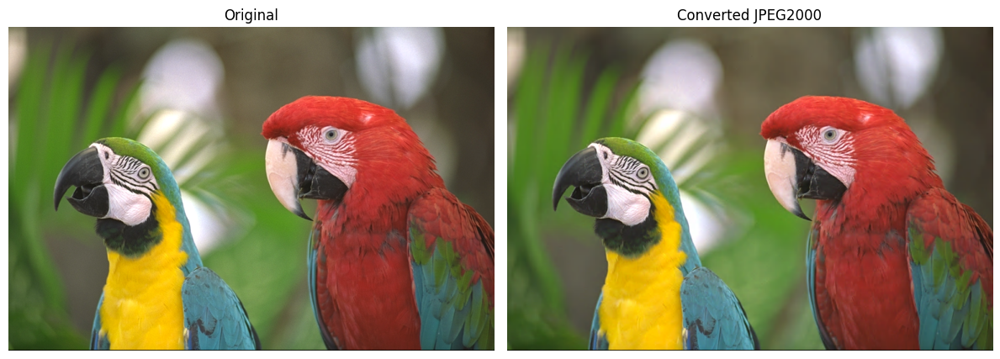

In [ ]:
import os
from PIL import Image
import numpy as np
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
import matplotlib.pyplot as plt

def convert_png_to_jpeg2000(image_path, quality=90, plot_save_path=None):
    """
    Converts a PNG image to JPEG2000 format, computes file sizes,
    compression ratio, PSNR, and MSSIM between the original and JPEG2000 image,
    and plots the original and converted images side by side.

    Parameters:
        image_path (str): Path to the PNG image.
        quality (int): Quality layer (in dB) for JPEG2000 compression.
                       (JPEG2000 quality settings differ from standard JPEG.)
        plot_save_path (str, optional): Path to save the comparison plot.
    """
    # Create JPEG2000 file path with .jp2 extension
    base, _ = os.path.splitext(image_path)
    jp2_path = base + ".jp2"

    try:
        # Open the original PNG image
        with Image.open(image_path) as img:
            # Handle transparency by pasting on a white background, if necessary.
            if img.mode in ("RGBA", "LA") or (img.mode == "P" and "transparency" in img.info):
                background = Image.new("RGB", img.size, (255, 255, 255))
                if img.mode == "RGBA":
                    background.paste(img, mask=img.split()[3])
                else:
                    background.paste(img)
                img = background
            else:
                img = img.convert("RGB")

            # Save the image in JPEG2000 format.
            # For JPEG2000, we use quality_mode="dB" and provide quality_layers as a list.
            img.save(jp2_path, "JPEG2000", quality_mode="dB", quality_layers=[quality])
        print(f"Successfully converted: {image_path} -> {jp2_path}")

        # Get file sizes (in bytes)
        png_size = os.path.getsize(image_path)
        jp2_size = os.path.getsize(jp2_path)

        # Calculate compression ratio (PNG / JPEG2000)
        compression_ratio = png_size / jp2_size
        print(f"PNG file size: {png_size/1024:.2f} KB")
        print(f"JPEG2000 file size: {jp2_size/1024:.2f} KB")
        print(f"Compression Ratio (PNG / JPEG2000): {compression_ratio:.2f}")

        # Load images as numpy arrays for quality metric calculations.
        original_img = np.array(Image.open(image_path).convert('RGB'))
        jp2_img = np.array(Image.open(jp2_path).convert('RGB'))

        # Determine an appropriate win_size for SSIM (must be an odd integer <= smallest image dimension)
        min_side = min(original_img.shape[0], original_img.shape[1])
        win_size = 7 if min_side >= 7 else (min_side // 2 * 2 + 1)

        # Compute PSNR (Peak Signal-to-Noise Ratio)
        psnr_value = psnr(original_img, jp2_img, data_range=255)

        # Compute MSSIM (Mean Structural Similarity Index)
        mssim_value = ssim(original_img, jp2_img, data_range=255, channel_axis=-1, win_size=win_size)

        print(f"PSNR (PNG vs JPEG2000): {psnr_value:.2f} dB")
        print(f"MSSIM (PNG vs JPEG2000): {mssim_value:.4f}")

        # Plot the original and JPEG2000 images side by side.
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        axes[0].imshow(original_img)
        axes[0].set_title("Original")
        axes[0].axis("off")
        axes[1].imshow(jp2_img)
        axes[1].set_title("Converted JPEG2000")
        axes[1].axis("off")
        plt.tight_layout()

        # Save the plot if a save path is provided.
        if plot_save_path:
            plt.savefig(plot_save_path)
            print(f"Plot saved to: {plot_save_path}")

        plt.show()

    except Exception as e:
        print(f"Error converting {image_path}: {e}")

# Specify the PNG image path and an optional plot save path.

image_path = "/content/drive/My Drive/Colab Notebooks/KODAK/DataSet-Kodak/kodim23.png"
plot_save_path = "/content/drive/My Drive/Colab Notebooks/KODAK/Output/jpeg2000_comparison.png"

# Convert the image and compute the compression ratio, PSNR, MSSIM, and display/save the comparison plot.
convert_png_to_jpeg2000(image_path, quality=41, plot_save_path=plot_save_path)


Successfully converted: /content/drive/My Drive/Colab Notebooks/KODAK/DataSet-Kodak/kodim23.png -> /content/drive/My Drive/Colab Notebooks/KODAK/DataSet-Kodak/kodim23.webp
PNG file size: 544.53 KB
WebP file size: 54.91 KB
Compression Ratio (PNG / WebP): 9.92
PSNR (PNG vs WebP): 39.95 dB
MSSIM (PNG vs WebP): 0.9615
Plot saved to: /content/drive/My Drive/Colab Notebooks/KODAK/Output/webpcomparison_plot.png


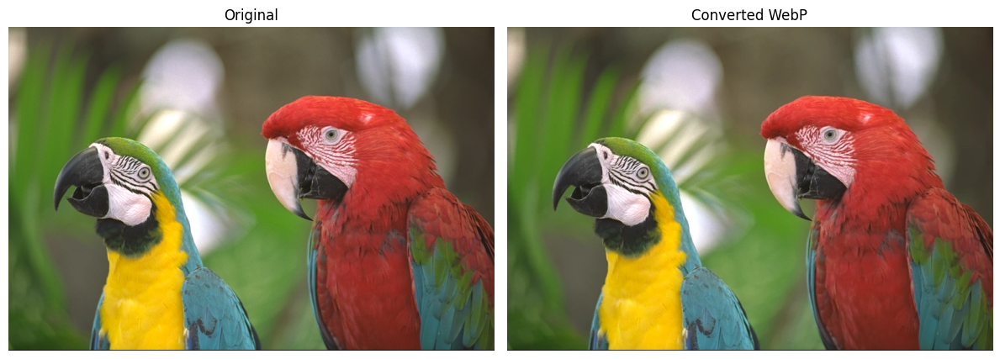

In [ ]:
import os
from PIL import Image
import numpy as np
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
import matplotlib.pyplot as plt

def convert_image_to_webp(image_path, quality=90, plot_save_path=None):
    # Split the image path into base and extension, then define the WebP filename.
    base, _ = os.path.splitext(image_path)
    webp_path = base + ".webp"

    try:
        # Open the original image and save it as WebP with the desired quality.
        with Image.open(image_path) as img:
            img.save(webp_path, "WEBP", quality=quality)
        print(f"Successfully converted: {image_path} -> {webp_path}")

        # Get file sizes (in bytes).
        png_size = os.path.getsize(image_path)
        webp_size = os.path.getsize(webp_path)

        # Calculate compression ratio (PNG size divided by WebP size).
        compression_ratio = png_size / webp_size
        print(f"PNG file size: {png_size/1024:.2f} KB")
        print(f"WebP file size: {webp_size/1024:.2f} KB")
        print(f"Compression Ratio (PNG / WebP): {compression_ratio:.2f}")

        # Load images as NumPy arrays for PSNR and MSSIM calculations.
        original_img = np.array(Image.open(image_path).convert('RGB'))
        webp_img = np.array(Image.open(webp_path).convert('RGB'))

        # Determine an appropriate win_size for SSIM (must be an odd integer <= smallest image dimension).
        min_side = min(original_img.shape[0], original_img.shape[1])
        win_size = 7 if min_side >= 7 else (min_side // 2 * 2 + 1)

        # Compute PSNR (Peak Signal-to-Noise Ratio).
        psnr_value = psnr(original_img, webp_img, data_range=255)

        # Compute MSSIM (Mean Structural Similarity Index).
        mssim_value = ssim(original_img, webp_img, data_range=255, channel_axis=-1, win_size=win_size)

        print(f"PSNR (PNG vs WebP): {psnr_value:.2f} dB")
        print(f"MSSIM (PNG vs WebP): {mssim_value:.4f}")

        # Plot the original and WebP images side by side.
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        axes[0].imshow(original_img)
        axes[0].set_title("Original")
        axes[0].axis("off")
        axes[1].imshow(webp_img)
        axes[1].set_title("Converted WebP")
        axes[1].axis("off")
        plt.tight_layout()

        # Save the plot if a save path is provided.
        if plot_save_path:
            plt.savefig(plot_save_path)
            print(f"Plot saved to: {plot_save_path}")

        plt.show()

    except Exception as e:
        print(f"Error converting {image_path}: {e}")

# Specify the image path and the path where you want to save the comparison plot.

image_path = "/content/drive/My Drive/Colab Notebooks/KODAK/DataSet-Kodak/kodim23.png"
plot_save_path = "/content/drive/My Drive/Colab Notebooks/KODAK/Output/webpcomparison_plot.png"


# Convert the image and compute the metrics.
convert_image_to_webp(image_path, quality=90, plot_save_path=plot_save_path)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


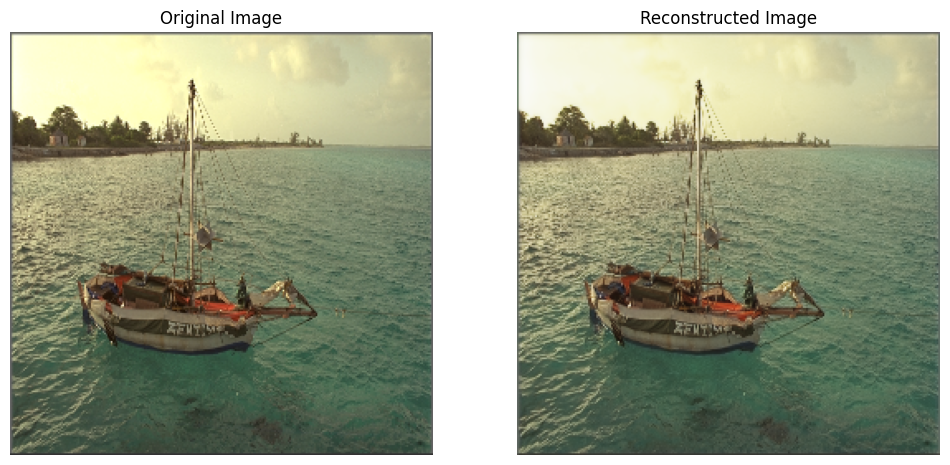

PSNR: 34.28 dB
MSSIM: 0.9912


In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim  # Import SSIM function

# ---------------------------
# Helper Function: Load and Preprocess a Single Image
# ---------------------------
def load_and_preprocess_image(image_path, target_size=(256, 256)):
    """
    Loads a single image from the given path, converts it to RGB, resizes it to target_size,
    normalizes the pixel values to [0,1], and applies histogram equalization on the luminance channel.
    """
    # Read image using OpenCV (reads as BGR)
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError("Image not found or unable to load: " + image_path)

    # Convert from BGR to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Resize image
    img = cv2.resize(img, target_size)
    # Normalize to [0,1]
    img = img.astype('float32') / 255.0

    # ----- Histogram Equalization on the Y channel -----
    img_8bit = (img * 255).astype(np.uint8)
    img_yuv = cv2.cvtColor(img_8bit, cv2.COLOR_RGB2YUV)
    img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])
    img_eq = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2RGB)
    img_eq = img_eq.astype('float32') / 255.0
    # ----------------------------------------------------
    return img

# ---------------------------
# PSNR Calculation Function
# ---------------------------
def calculate_psnr(original, reconstructed):
    mse = np.mean((original - reconstructed) ** 2)
    max_pixel = 1.0  # Since images are normalized to [0,1]
    psnr = 10 * np.log10((max_pixel ** 2) / mse)
    return psnr

# ---------------------------
# MSSIM Calculation Function
# ---------------------------
def calculate_mssim(original, reconstructed):
    """
    Calculates the Mean Structural Similarity Index (MSSIM) between two images.
    For color images, set channel_axis to -1 (the last axis).
    """
    mssim_value = ssim(original, reconstructed, channel_axis=-1, data_range=1.0)
    return mssim_value


# ---------------------------
# Paths for the Single Image
# ---------------------------

single_image_path = "/content/drive/My Drive/Colab Notebooks/KODAK/DataSet-Kodak/kodim06.png" # Provide your single image path here
compressed_image_path = "/content/drive/My Drive/Colab Notebooks/KODAK/Output/compressed_image.jpg" # Path to store compressed image

# ---------------------------
# Load and Preprocess the Single Image
# ---------------------------
single_image = load_and_preprocess_image(single_image_path, target_size=(256, 256))

# ---------------------------
# Pass the Image through the Autoencoder
# ---------------------------
# Expand dims to create a batch (model.predict expects a batch dimension)
single_image_batch = np.expand_dims(single_image, axis=0)

# Predict the reconstruction using your autoencoder
# (Ensure that your autoencoder model is already defined and loaded)
reconstructed_batch = autoencoder.predict(single_image_batch)
# Remove the batch dimension to get a single image
reconstructed_image = reconstructed_batch[0]

# ---------------------------
# Save the Reconstructed Image for BPP Calculation
# ---------------------------
cv2.imwrite(compressed_image_path, (reconstructed_image * 255).astype(np.uint8))

# ---------------------------
# Calculate PSNR, MSSIM, and BPP
# ---------------------------
psnr_value = calculate_psnr(single_image, reconstructed_image)
mssim_value = calculate_mssim(single_image, reconstructed_image)


# ---------------------------
# Display the Original and Reconstructed Images Side by Side
# ---------------------------
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(single_image)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image)
plt.title("Reconstructed Image")
plt.axis("off")
plt.show()

# Print PSNR, MSSIM, and BPP values
print(f"PSNR: {psnr_value:.2f} dB")
print(f"MSSIM: {mssim_value:.4f}")



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


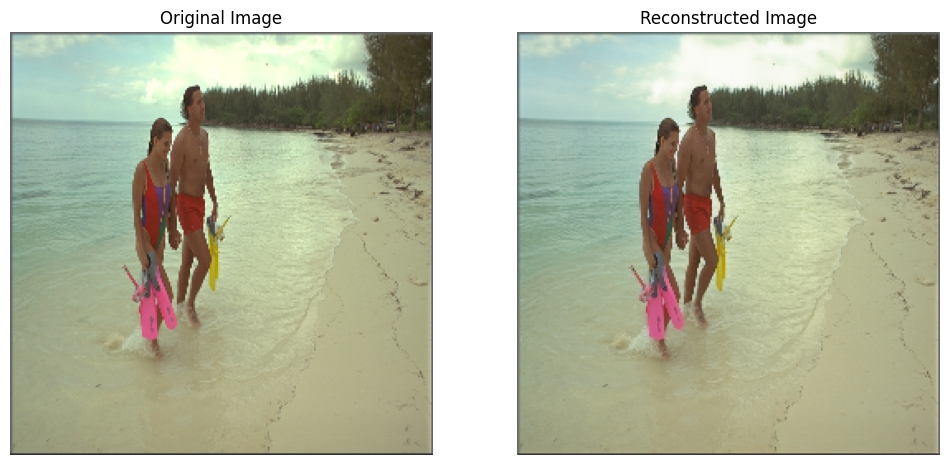

PSNR: 35.20 dB
MSSIM: 0.9883


In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim  # Import SSIM function

# ---------------------------
# Helper Function: Load and Preprocess a Single Image
# ---------------------------
def load_and_preprocess_image(image_path, target_size=(256, 256)):
    """
    Loads a single image from the given path, converts it to RGB, resizes it to target_size,
    normalizes the pixel values to [0,1], and applies histogram equalization on the luminance channel.
    """
    # Read image using OpenCV (reads as BGR)
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError("Image not found or unable to load: " + image_path)

    # Convert from BGR to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Resize image
    img = cv2.resize(img, target_size)
    # Normalize to [0,1]
    img = img.astype('float32') / 255.0


    return img

# ---------------------------
# PSNR Calculation Function
# ---------------------------
def calculate_psnr(original, reconstructed):
    mse = np.mean((original - reconstructed) ** 2)
    if mse == 0:
        return 100  # Return a high PSNR if no error
    max_pixel = 1.0  # Since images are normalized to [0,1]
    psnr = 10 * np.log10((max_pixel ** 2) / mse)
    return psnr

# ---------------------------
# MSSIM Calculation Function
# ---------------------------
def calculate_mssim(original, reconstructed):
    """
    Calculates the Mean Structural Similarity Index (MSSIM) between two images.
    For color images, set channel_axis to -1 (the last axis).
    """
    mssim_value = ssim(original, reconstructed, channel_axis=-1, data_range=1.0)
    return mssim_value


# ---------------------------
# Paths for the Single Image
# ---------------------------

single_image_path = "/content/drive/My Drive/Colab Notebooks/KODAK/DataSet-Kodak/kodim12.png" # Path to store compressed image
compressed_image_path = "/content/drive/My Drive/Colab Notebooks/KODAK/Output/compressed_image.jpg" # Path to store compressed image

# ---------------------------
# Load and Preprocess the Single Image
# ---------------------------
single_image = load_and_preprocess_image(single_image_path, target_size=(256, 256))

# ---------------------------
# Pass the Image through the Autoencoder
# ---------------------------
# Expand dims to create a batch (model.predict expects a batch dimension)
single_image_batch = np.expand_dims(single_image, axis=0)

# Predict the reconstruction using your autoencoder
# (Ensure that your autoencoder model is already defined and loaded)
reconstructed_batch = autoencoder.predict(single_image_batch)
# Remove the batch dimension to get a single image
reconstructed_image = reconstructed_batch[0]

# ---------------------------
# Save the Reconstructed Image for BPP Calculation
# ---------------------------
cv2.imwrite(compressed_image_path, (reconstructed_image * 255).astype(np.uint8))

# ---------------------------
# Calculate PSNR, MSSIM, and BPP
# ---------------------------
psnr_value = calculate_psnr(single_image, reconstructed_image)
mssim_value = calculate_mssim(single_image, reconstructed_image)


# ---------------------------
# Display the Original and Reconstructed Images Side by Side
# ---------------------------
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(single_image)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image)
plt.title("Reconstructed Image")
plt.axis("off")
plt.show()

# Print PSNR, MSSIM, and BPP values
print(f"PSNR: {psnr_value:.2f} dB")
print(f"MSSIM: {mssim_value:.4f}")



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


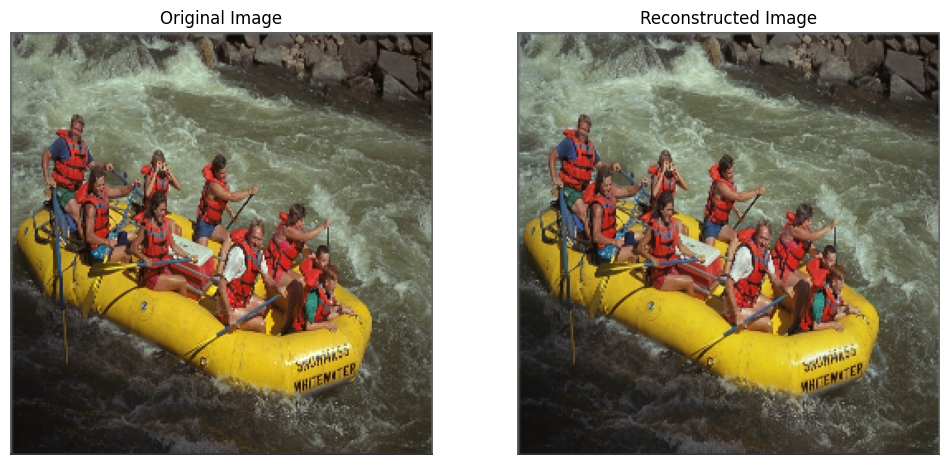

PSNR: 35.74 dB
MSSIM: 0.9911


In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim  # Import SSIM function

# ---------------------------
# Helper Function: Load and Preprocess a Single Image
# ---------------------------
def load_and_preprocess_image(image_path, target_size=(256, 256)):
    """
    Loads a single image from the given path, converts it to RGB, resizes it to target_size,
    normalizes the pixel values to [0,1], and applies histogram equalization on the luminance channel.
    """
    # Read image using OpenCV (reads as BGR)
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError("Image not found or unable to load: " + image_path)

    # Convert from BGR to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Resize image
    img = cv2.resize(img, target_size)
    # Normalize to [0,1]
    img = img.astype('float32') / 255.0

    return img

# ---------------------------
# PSNR Calculation Function
# ---------------------------
def calculate_psnr(original, reconstructed):
    mse = np.mean((original - reconstructed) ** 2)
    if mse == 0:
        return 100  # Return a high PSNR if no error
    max_pixel = 1.0  # Since images are normalized to [0,1]
    psnr = 10 * np.log10((max_pixel ** 2) / mse)
    return psnr

# ---------------------------
# MSSIM Calculation Function
# ---------------------------
def calculate_mssim(original, reconstructed):
    """
    Calculates the Mean Structural Similarity Index (MSSIM) between two images.
    For color images, set channel_axis to -1 (the last axis).
    """
    mssim_value = ssim(original, reconstructed, channel_axis=-1, data_range=1.0)
    return mssim_value


# ---------------------------
# Paths for the Single Image
# ---------------------------

single_image_path = "/content/drive/My Drive/Colab Notebooks/KODAK/DataSet-Kodak/kodim14.png" # Provide your single image path here
compressed_image_path = "/content/drive/My Drive/Colab Notebooks/KODAK/Output/compressed_image.jpg" # Path to store compressed image

# ---------------------------
# Load and Preprocess the Single Image
# ---------------------------
single_image = load_and_preprocess_image(single_image_path, target_size=(256, 256))

# ---------------------------
# Pass the Image through the Autoencoder
# ---------------------------
# Expand dims to create a batch (model.predict expects a batch dimension)
single_image_batch = np.expand_dims(single_image, axis=0)

# Predict the reconstruction using your autoencoder
# (Ensure that your autoencoder model is already defined and loaded)
reconstructed_batch = autoencoder.predict(single_image_batch)
# Remove the batch dimension to get a single image
reconstructed_image = reconstructed_batch[0]

# ---------------------------
# Save the Reconstructed Image for BPP Calculation
# ---------------------------
cv2.imwrite(compressed_image_path, (reconstructed_image * 255).astype(np.uint8))

# ---------------------------
# Calculate PSNR, MSSIM, and BPP
# ---------------------------
psnr_value = calculate_psnr(single_image, reconstructed_image)
mssim_value = calculate_mssim(single_image, reconstructed_image)


# ---------------------------
# Display the Original and Reconstructed Images Side by Side
# ---------------------------
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(single_image)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image)
plt.title("Reconstructed Image")
plt.axis("off")
plt.show()

# Print PSNR, MSSIM, and BPP values
print(f"PSNR: {psnr_value:.2f} dB")
print(f"MSSIM: {mssim_value:.4f}")



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


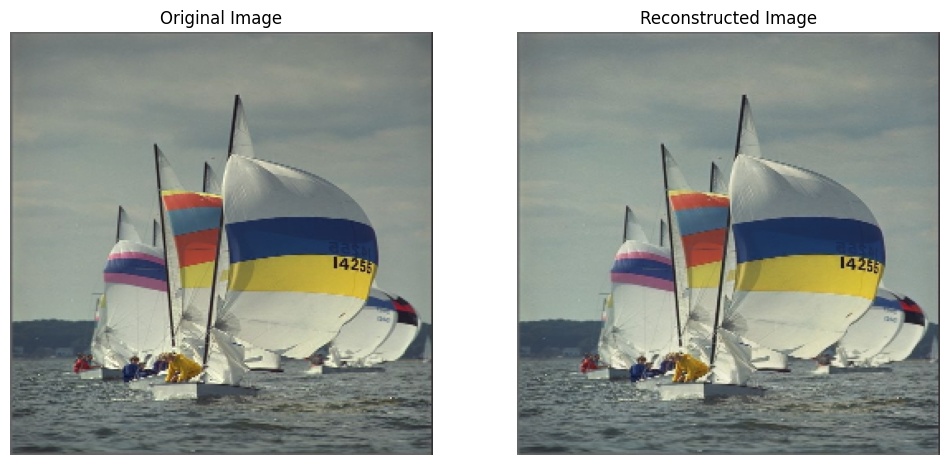

PSNR: 36.47 dB
MSSIM: 0.9955


In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim  # Import SSIM function

# ---------------------------
# Helper Function: Load and Preprocess a Single Image
# ---------------------------
def load_and_preprocess_image(image_path, target_size=(256, 256)):
    """
    Loads a single image from the given path, converts it to RGB, resizes it to target_size,
    normalizes the pixel values to [0,1], and applies histogram equalization on the luminance channel.
    """
    # Read image using OpenCV (reads as BGR)
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError("Image not found or unable to load: " + image_path)

    # Convert from BGR to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Resize image
    img = cv2.resize(img, target_size)
    # Normalize to [0,1]
    img = img.astype('float32') / 255.0

    return img

# ---------------------------
# PSNR Calculation Function
# ---------------------------
def calculate_psnr(original, reconstructed):
    mse = np.mean((original - reconstructed) ** 2)
    if mse == 0:
        return 100  # Return a high PSNR if no error
    max_pixel = 1.0  # Since images are normalized to [0,1]
    psnr = 10 * np.log10((max_pixel ** 2) / mse)
    return psnr

# ---------------------------
# MSSIM Calculation Function
# ---------------------------
def calculate_mssim(original, reconstructed):
    """
    Calculates the Mean Structural Similarity Index (MSSIM) between two images.
    For color images, set channel_axis to -1 (the last axis).
    """
    mssim_value = ssim(original, reconstructed, channel_axis=-1, data_range=1.0)
    return mssim_value


# ---------------------------
# Paths for the Single Image
# ---------------------------

single_image_path = "/content/drive/My Drive/Colab Notebooks/KODAK/Compressed_BitRate/compressed_1.12/kodim09.jpg" # Provide your single image path here
compressed_image_path = "/content/drive/My Drive/Colab Notebooks/KODAK/Output/compressed_image.jpg" # Path to store compressed image

# ---------------------------
# Load and Preprocess the Single Image
# ---------------------------
single_image = load_and_preprocess_image(single_image_path, target_size=(256, 256))

# ---------------------------
# Pass the Image through the Autoencoder
# ---------------------------
# Expand dims to create a batch (model.predict expects a batch dimension)
single_image_batch = np.expand_dims(single_image, axis=0)

# Predict the reconstruction using your autoencoder
# (Ensure that your autoencoder model is already defined and loaded)
reconstructed_batch = autoencoder.predict(single_image_batch)
# Remove the batch dimension to get a single image
reconstructed_image = reconstructed_batch[0]

# ---------------------------
# Save the Reconstructed Image for BPP Calculation
# ---------------------------
cv2.imwrite(compressed_image_path, (reconstructed_image * 255).astype(np.uint8))

# ---------------------------
# Calculate PSNR, MSSIM, and BPP
# ---------------------------
psnr_value = calculate_psnr(single_image, reconstructed_image)
mssim_value = calculate_mssim(single_image, reconstructed_image)


# ---------------------------
# Display the Original and Reconstructed Images Side by Side
# ---------------------------
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(single_image)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image)
plt.title("Reconstructed Image")
plt.axis("off")
plt.show()

# Print PSNR, MSSIM, and BPP values
print(f"PSNR: {psnr_value:.2f} dB")
print(f"MSSIM: {mssim_value:.4f}")



Columns in /content/drive/My Drive/Colab Notebooks/results/First/1.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/First/2.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/First/3.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/First/4.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/First/5.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/First/6.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/First/proposed.csv: ['A', 'B']


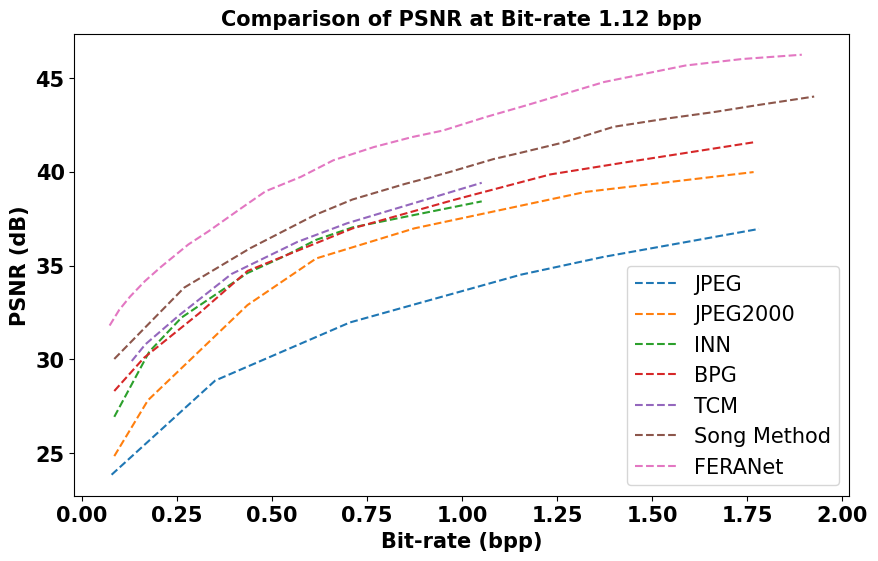

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# List of CSV file paths
csv_files = [
    r"/content/drive/My Drive/Colab Notebooks/results/First/1.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/First/2.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/First/3.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/First/4.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/First/5.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/First/6.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/First/proposed.csv",
]

single_image_path = "/content/drive/My Drive/Colab Notebooks/KODAK/DataSet-Kodak/kodim23.png"
output_dir = "/content/drive/My Drive/Colab Notebooks/KODAK/Output/kodim23_WebpCompressed"

# Custom legend labels in the desired order
legend_labels = ["JPEG", "JPEG2000", "INN", "BPG", "TCM", "Song Method", "FERANet"]

plt.figure(figsize=(10, 6))

# Dictionary to store the PSNR value at bit-rate 1.12 for each method
psnr_at_112 = {}

# Loop through each CSV file, read the data, and plot it
for i, file in enumerate(csv_files):
    df = pd.read_csv(file)
    # Debug: print columns to ensure they are as expected
    print(f"Columns in {file}: {df.columns.tolist()}")

    # Plot using column 'A' as x (bit-rate) and 'B' as y (PSNR)
    plt.plot(df['A'], df['B'], linestyle='--', label=legend_labels[i])

    # Find the row where 'A' (bit-rate) is closest to 1.12
    idx = (df['A'] - 1.12).abs().idxmin()
    psnr_value_at_112 = df.loc[idx, 'B']
    psnr_at_112[legend_labels[i]] = psnr_value_at_112

# Set axis labels with fontsize 15 and bold
plt.xlabel('Bit-rate (bpp)', fontsize=15, fontweight='bold')
plt.ylabel('PSNR (dB)', fontsize=15, fontweight='bold')
plt.xticks(fontsize=15, fontweight='bold')
plt.yticks(fontsize=15, fontweight='bold')

# Create a title string that shows the PSNR at bit-rate 1.12 for each method
title_str = "Comparison of PSNR at Bit-rate 1.12 bpp"

plt.title(title_str, fontsize=15, fontweight='bold')
plt.legend(fontsize=15)
plt.show()


Columns in /content/drive/My Drive/Colab Notebooks/results/Second/1.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/Second/2.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/Second/3.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/Second/4.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/Second/5.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/Second/6.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/Second/Proposed.csv: ['A', 'B']


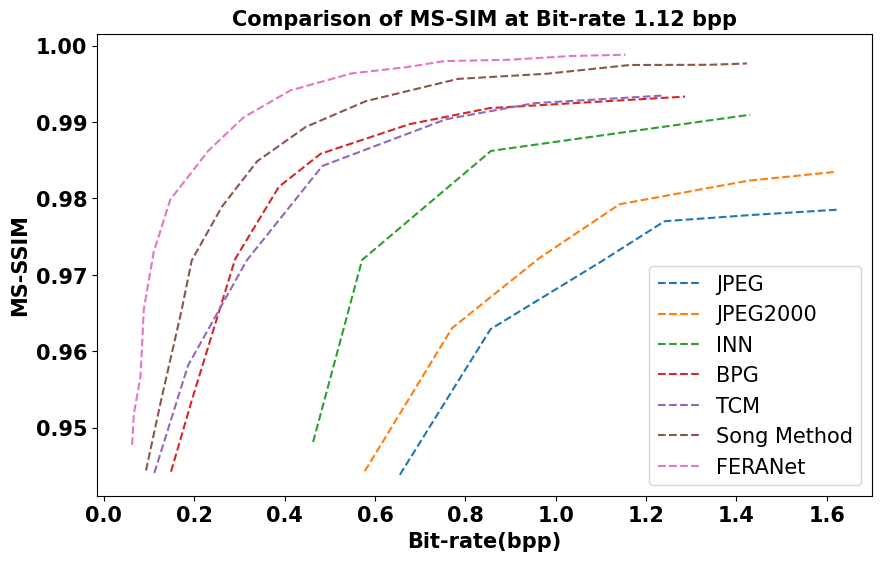

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# List of CSV file paths
csv_files = [
    r"/content/drive/My Drive/Colab Notebooks/results/Second/1.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/Second/2.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/Second/3.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/Second/4.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/Second/5.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/Second/6.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/Second/Proposed.csv",
]

# Custom legend labels in the desired order
legend_labels = ["JPEG", "JPEG2000", "INN", "BPG", "TCM", "Song Method", "FERANet"]

plt.figure(figsize=(10, 6))

# Loop through each CSV file, read the data, and plot it
for i, file in enumerate(csv_files):
    df = pd.read_csv(file)
    # Debug: print columns to ensure they are as expected
    print(f"Columns in {file}: {df.columns.tolist()}")

    # Check if the file is the proposed CSV to assign a dark blue color
    if file.endswith("proposed.csv"):

        plt.plot(df['A'], df['B'], linestyle='--', label=legend_labels[i], color='black')
    else:
        plt.plot(df['A'], df['B'], linestyle='--', label=legend_labels[i])

# Set the axis labels with fontsize 15 and bold
plt.xlabel('Bit-rate(bpp)', fontsize=15, fontweight='bold')
plt.ylabel('MS-SSIM', fontsize=15, fontweight='bold')

# Set tick labels for both axes with fontsize 15 and bold
plt.xticks(fontsize=15, fontweight='bold')
plt.yticks(fontsize=15, fontweight='bold')

# Set legend font size and display the legend
plt.legend(fontsize=15)
title_str = "Comparison of MS-SIM at Bit-rate 1.12 bpp"

plt.title(title_str, fontsize=15, fontweight='bold')

plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


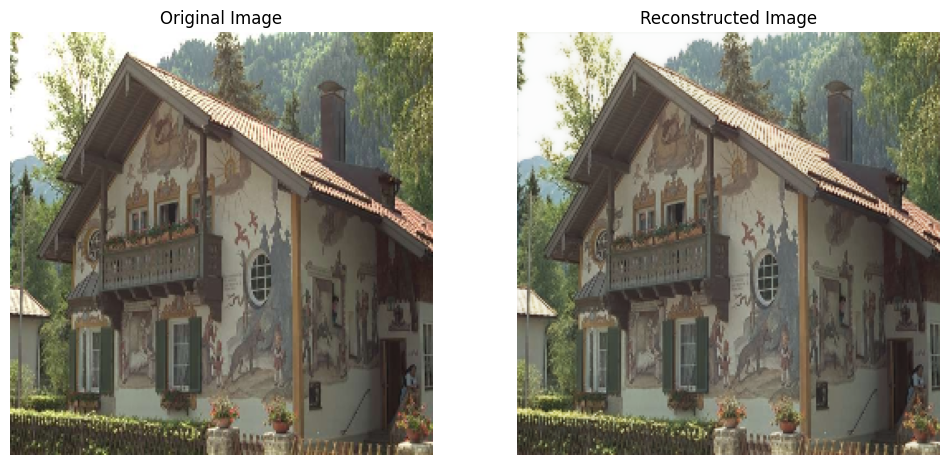

PSNR: 35.34 dB
MSSIM: 0.9925


In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim  # Import SSIM function

# ---------------------------
# Helper Function: Load and Preprocess a Single Image
# ---------------------------
def load_and_preprocess_image(image_path, target_size=(256, 256)):
    """
    Loads a single image from the given path, converts it to RGB, resizes it to target_size,
    normalizes the pixel values to [0,1], and applies histogram equalization on the luminance channel.
    """
    # Read image using OpenCV (reads as BGR)
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError("Image not found or unable to load: " + image_path)

    # Convert from BGR to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Resize image
    img = cv2.resize(img, target_size)
    # Normalize to [0,1]
    img = img.astype('float32') / 255.0

    return img

# ---------------------------
# PSNR Calculation Function
# ---------------------------
def calculate_psnr(original, reconstructed):
    mse = np.mean((original - reconstructed) ** 2)
    if mse == 0:
        return 100  # Return a high PSNR if no error
    max_pixel = 1.0  # Since images are normalized to [0,1]
    psnr = 10 * np.log10((max_pixel ** 2) / mse)
    return psnr

# ---------------------------
# MSSIM Calculation Function
# ---------------------------
def calculate_mssim(original, reconstructed):
    """
    Calculates the Mean Structural Similarity Index (MSSIM) between two images.
    For color images, set channel_axis to -1 (the last axis).
    """
    mssim_value = ssim(original, reconstructed, channel_axis=-1, data_range=1.0)
    return mssim_value


# ---------------------------
# Paths for the Single Image
# ---------------------------

single_image_path = "/content/drive/My Drive/Colab Notebooks/KODAK/Compressed_BitRate/compressed_1.25/kodim24.jpg" # Provide your single image path here
compressed_image_path = "/content/drive/My Drive/Colab Notebooks/KODAK/Output/compressed_image.jpg" # Path to store compressed image

# ---------------------------
# Load and Preprocess the Single Image
# ---------------------------
single_image = load_and_preprocess_image(single_image_path, target_size=(256, 256))

# ---------------------------
# Pass the Image through the Autoencoder
# ---------------------------
# Expand dims to create a batch (model.predict expects a batch dimension)
single_image_batch = np.expand_dims(single_image, axis=0)

# Predict the reconstruction using your autoencoder
# (Ensure that your autoencoder model is already defined and loaded)
reconstructed_batch = autoencoder.predict(single_image_batch)
# Remove the batch dimension to get a single image
reconstructed_image = reconstructed_batch[0]

# ---------------------------
# Save the Reconstructed Image for BPP Calculation
# ---------------------------
cv2.imwrite(compressed_image_path, (reconstructed_image * 255).astype(np.uint8))

# ---------------------------
# Calculate PSNR, MSSIM, and BPP
# ---------------------------
psnr_value = calculate_psnr(single_image, reconstructed_image)
mssim_value = calculate_mssim(single_image, reconstructed_image)


# ---------------------------
# Display the Original and Reconstructed Images Side by Side
# ---------------------------
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(single_image)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image)
plt.title("Reconstructed Image")
plt.axis("off")
plt.show()

# Print PSNR, MSSIM, and BPP values
print(f"PSNR: {psnr_value:.2f} dB")
print(f"MSSIM: {mssim_value:.4f}")



Columns in /content/drive/My Drive/Colab Notebooks/results/Fourth/1.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/Fourth/3.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/Fourth/4.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/Fourth/5.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/Fourth/6.csv: ['A', 'B']


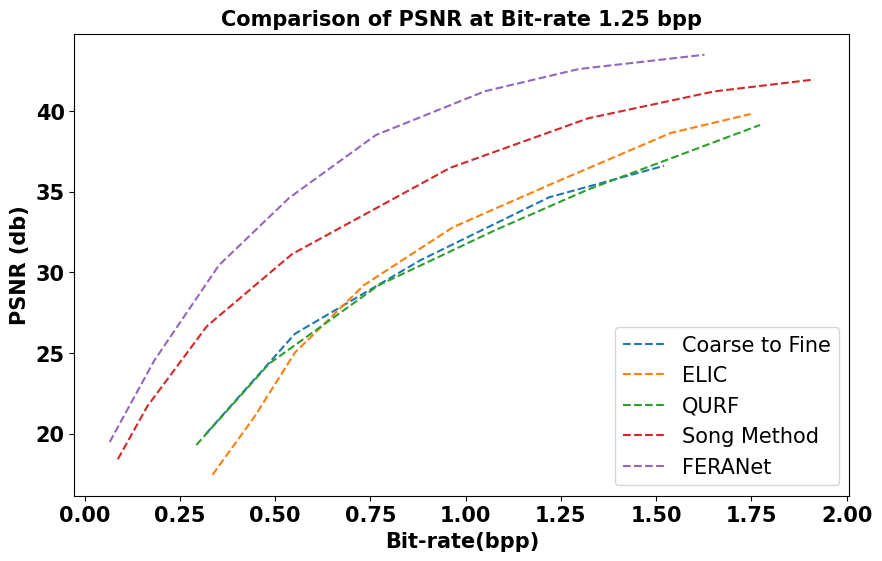

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# List of CSV file paths
csv_files = [
    r"/content/drive/My Drive/Colab Notebooks/results/Fourth/1.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/Fourth/3.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/Fourth/4.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/Fourth/5.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/Fourth/6.csv",
]



# Custom legend labels in the desired order
legend_labels = [ "Coarse to Fine", "ELIC", "QURF", "Song Method", "FERANet"]

plt.figure(figsize=(10, 6))

# Loop through each CSV file, read the data, and plot it
for i, file in enumerate(csv_files):
    df = pd.read_csv(file)
    # Debug: print columns to ensure they are as expected
    print(f"Columns in {file}: {df.columns.tolist()}")
    # Plot using column 'A' as x and column 'B' as y
    plt.plot(df['A'], df['B'], linestyle='--', label=legend_labels[i])

# Set the axis labels with fontsize 15 and bold
plt.xlabel('Bit-rate(bpp)', fontsize=15, fontweight='bold')
plt.ylabel('PSNR (db)', fontsize=15, fontweight='bold')

# Set tick labels for both axes with fontsize 15 and bold
plt.xticks(fontsize=15, fontweight='bold')
plt.yticks(fontsize=15, fontweight='bold')

# Optionally, uncomment the next line to add a title
# plt.title('Line Graph from CSV Files', fontsize=15, fontweight='bold')

# Set legend font size and display the legend
plt.legend(fontsize=15)
# Create a title string that shows the PSNR at bit-rate 1.12 for each method
title_str = "Comparison of PSNR at Bit-rate 1.25 bpp"

plt.title(title_str, fontsize=15, fontweight='bold')

plt.show()


Columns in /content/drive/My Drive/Colab Notebooks/results/Third/3.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/Third/4.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/Third/5.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/Third/6.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/Third/Proposed.csv: ['A', 'B']


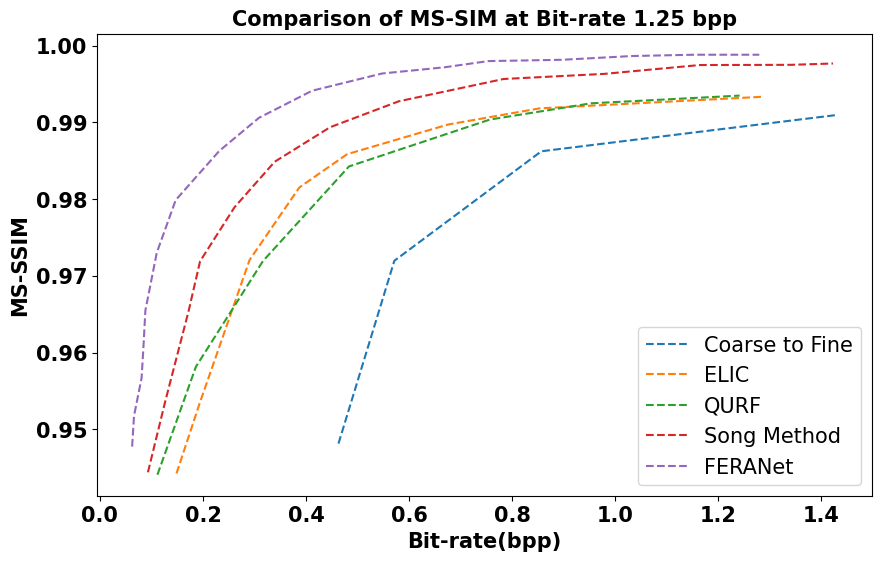

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# List of CSV file paths
csv_files = [
    r"/content/drive/My Drive/Colab Notebooks/results/Third/3.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/Third/4.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/Third/5.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/Third/6.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/Third/Proposed.csv",
]



# Custom legend labels in the desired order
legend_labels = ["Coarse to Fine", "ELIC", "QURF", "Song Method", "FERANet"]

plt.figure(figsize=(10, 6))

# Loop through each CSV file, read the data, and plot it
for i, file in enumerate(csv_files):
    df = pd.read_csv(file)
    # Debug: print columns to ensure they are as expected
    print(f"Columns in {file}: {df.columns.tolist()}")

    # Check if the file is the proposed CSV to assign a dark blue color
    if file.endswith("proposed.csv"):
        plt.plot(df['A'], df['B'], linestyle='--', label=legend_labels[i], color='black')
    else:
        plt.plot(df['A'], df['B'], linestyle='--', label=legend_labels[i])

# Set the axis labels with fontsize 15 and bold
plt.xlabel('Bit-rate(bpp)', fontsize=15, fontweight='bold')
plt.ylabel('MS-SSIM', fontsize=15, fontweight='bold')

# Set tick labels for both axes with fontsize 15 and bold
plt.xticks(fontsize=15, fontweight='bold')
plt.yticks(fontsize=15, fontweight='bold')

# Set legend font size and display the legend
plt.legend(fontsize=15)
# Create a title string that shows the PSNR at bit-rate 1.12 for each method
title_str = "Comparison of MS-SIM at Bit-rate 1.25 bpp"

plt.title(title_str, fontsize=15, fontweight='bold')

plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


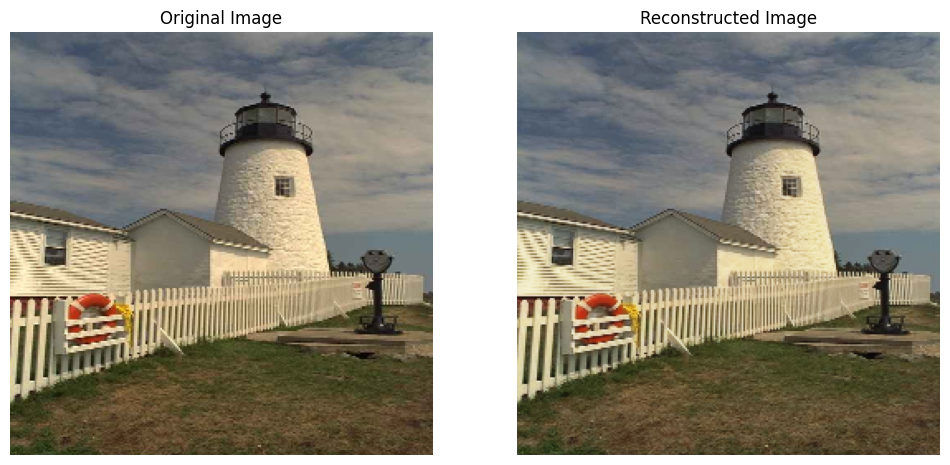

PSNR: 36.19 dB
MSSIM: 0.9931


In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim  # Import SSIM function

# ---------------------------
# Helper Function: Load and Preprocess a Single Image
# ---------------------------
def load_and_preprocess_image(image_path, target_size=(256, 256)):
    """
    Loads a single image from the given path, converts it to RGB, resizes it to target_size,
    normalizes the pixel values to [0,1], and applies histogram equalization on the luminance channel.
    """
    # Read image using OpenCV (reads as BGR)
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError("Image not found or unable to load: " + image_path)

    # Convert from BGR to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Resize image
    img = cv2.resize(img, target_size)
    # Normalize to [0,1]
    img = img.astype('float32') / 255.0

    return img

# ---------------------------
# PSNR Calculation Function
# ---------------------------
def calculate_psnr(original, reconstructed):
    mse = np.mean((original - reconstructed) ** 2)
    if mse == 0:
        return 100  # Return a high PSNR if no error
    max_pixel = 1.0  # Since images are normalized to [0,1]
    psnr = 10 * np.log10((max_pixel ** 2) / mse)
    return psnr

# ---------------------------
# MSSIM Calculation Function
# ---------------------------
def calculate_mssim(original, reconstructed):
    """
    Calculates the Mean Structural Similarity Index (MSSIM) between two images.
    For color images, set channel_axis to -1 (the last axis).
    """
    mssim_value = ssim(original, reconstructed, channel_axis=-1, data_range=1.0)
    return mssim_value


# ---------------------------
# Paths for the Single Image
# ---------------------------

single_image_path = "/content/drive/My Drive/Colab Notebooks/KODAK/Compressed_BitRate/compressed_0.75/kodim19.jpg" # Provide your single image path here
compressed_image_path = "/content/drive/My Drive/Colab Notebooks/KODAK/Output/compressed_image.jpg" # Path to store compressed image

# ---------------------------
# Load and Preprocess the Single Image
# ---------------------------
single_image = load_and_preprocess_image(single_image_path, target_size=(256, 256))

# ---------------------------
# Pass the Image through the Autoencoder
# ---------------------------
# Expand dims to create a batch (model.predict expects a batch dimension)
single_image_batch = np.expand_dims(single_image, axis=0)

# Predict the reconstruction using your autoencoder
# (Ensure that your autoencoder model is already defined and loaded)
reconstructed_batch = autoencoder.predict(single_image_batch)
# Remove the batch dimension to get a single image
reconstructed_image = reconstructed_batch[0]

# ---------------------------
# Save the Reconstructed Image for BPP Calculation
# ---------------------------
cv2.imwrite(compressed_image_path, (reconstructed_image * 255).astype(np.uint8))

# ---------------------------
# Calculate PSNR, MSSIM, and BPP
# ---------------------------
psnr_value = calculate_psnr(single_image, reconstructed_image)
mssim_value = calculate_mssim(single_image, reconstructed_image)


# ---------------------------
# Display the Original and Reconstructed Images Side by Side
# ---------------------------
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(single_image)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image)
plt.title("Reconstructed Image")
plt.axis("off")
plt.show()

# Print PSNR, MSSIM, and BPP values
print(f"PSNR: {psnr_value:.2f} dB")
print(f"MSSIM: {mssim_value:.4f}")



Columns in /content/drive/My Drive/Colab Notebooks/results/Fifth/1.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/Fifth/2.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/Fifth/3.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/Fifth/4.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/Fifth/5.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/Fifth/Proposed.csv: ['A', 'B']


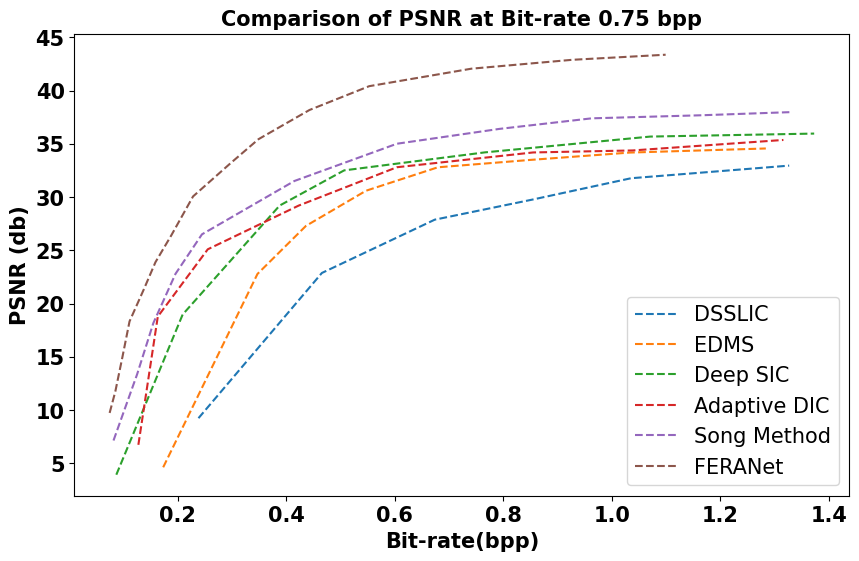

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# List of CSV file paths
csv_files = [
    r"/content/drive/My Drive/Colab Notebooks/results/Fifth/1.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/Fifth/2.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/Fifth/3.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/Fifth/4.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/Fifth/5.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/Fifth/Proposed.csv",
]


# Custom legend labels in the desired order
legend_labels = ["DSSLIC", "EDMS", "Deep SIC", "Adaptive DIC", "Song Method", "FERANet"]

plt.figure(figsize=(10, 6))

# Loop through each CSV file, read the data, and plot it
for i, file in enumerate(csv_files):
    df = pd.read_csv(file)
    # Debug: print columns to ensure they are as expected
    print(f"Columns in {file}: {df.columns.tolist()}")
    # Plot using column 'A' as x and column 'B' as y
    plt.plot(df['A'], df['B'], linestyle='--', label=legend_labels[i])

# Set the axis labels with fontsize 15 and bold
plt.xlabel('Bit-rate(bpp)', fontsize=15, fontweight='bold')
plt.ylabel('PSNR (db)', fontsize=15, fontweight='bold')

# Set tick labels for both axes with fontsize 15 and bold
plt.xticks(fontsize=15, fontweight='bold')
plt.yticks(fontsize=15, fontweight='bold')

# Optionally, uncomment the next line to add a title
# plt.title('Line Graph from CSV Files', fontsize=15, fontweight='bold')

# Set legend font size and display the legend
plt.legend(fontsize=15)
# Create a title string that shows the PSNR at bit-rate 1.12 for each method
title_str = "Comparison of PSNR at Bit-rate 0.75 bpp"

plt.title(title_str, fontsize=15, fontweight='bold')

plt.show()


Columns in /content/drive/My Drive/Colab Notebooks/results/Sixth/1.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/Sixth/2.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/Sixth/3.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/Sixth/4.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/Sixth/5.csv: ['A', 'B']
Columns in /content/drive/My Drive/Colab Notebooks/results/Sixth/Proposed.csv: ['A', 'B']


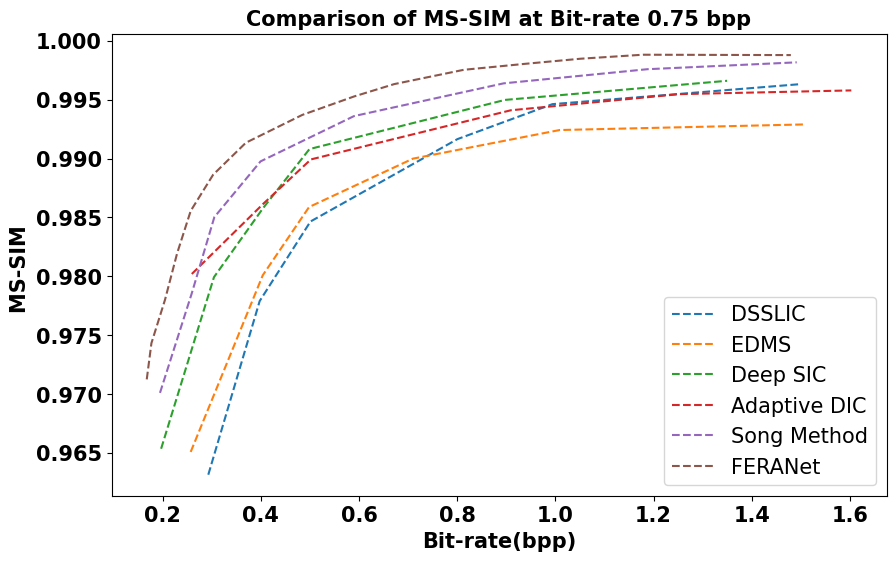

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# List of CSV file paths
csv_files = [
    r"/content/drive/My Drive/Colab Notebooks/results/Sixth/1.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/Sixth/2.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/Sixth/3.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/Sixth/4.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/Sixth/5.csv",
    r"/content/drive/My Drive/Colab Notebooks/results/Sixth/Proposed.csv",
]


# Custom legend labels in the desired order
legend_labels = ["DSSLIC", "EDMS", "Deep SIC", "Adaptive DIC", "Song Method", "FERANet"]

plt.figure(figsize=(10, 6))

# Loop through each CSV file, read the data, and plot it
for i, file in enumerate(csv_files):
    df = pd.read_csv(file)
    # Debug: print columns to ensure they are as expected
    print(f"Columns in {file}: {df.columns.tolist()}")
    # Plot using column 'A' as x and column 'B' as y
    plt.plot(df['A'], df['B'], linestyle='--', label=legend_labels[i])

# Set the axis labels with fontsize 15 and bold
plt.xlabel('Bit-rate(bpp)', fontsize=15, fontweight='bold')
plt.ylabel('MS-SIM ', fontsize=15, fontweight='bold')

# Set tick labels for both axes with fontsize 15 and bold
plt.xticks(fontsize=15, fontweight='bold')
plt.yticks(fontsize=15, fontweight='bold')

# Optionally, uncomment the next line to add a title
# plt.title('Line Graph from CSV Files', fontsize=15, fontweight='bold')

# Set legend font size and display the legend
plt.legend(fontsize=15)
# Create a title string that shows the PSNR at bit-rate 1.12 for each method
title_str = "Comparison of MS-SIM at Bit-rate 0.75 bpp"

plt.title(title_str, fontsize=15, fontweight='bold')

plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


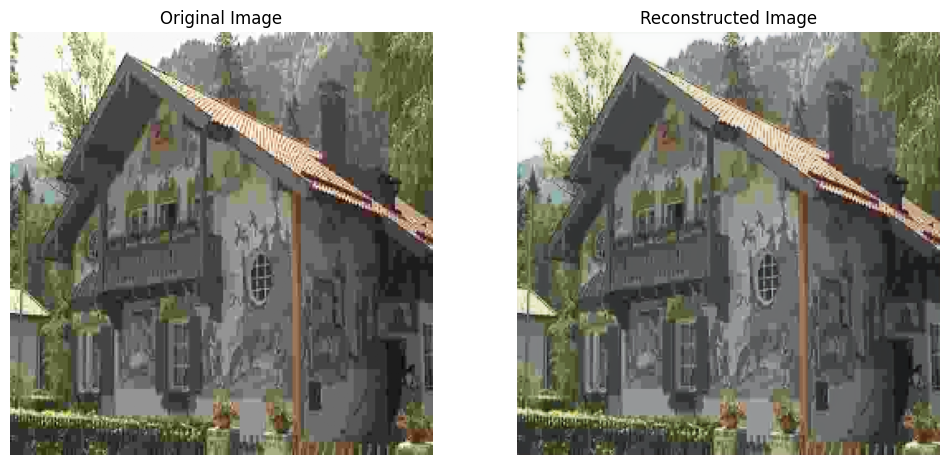

PSNR: 35.62 dB
MSSIM: 0.9918


In [ ]:
#Image Comparision
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim  # Import SSIM function

# ---------------------------
# Helper Function: Load and Preprocess a Single Image
# ---------------------------
def load_and_preprocess_image(image_path, target_size=(256, 256)):

    # Read image using OpenCV (reads as BGR)
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError("Image not found or unable to load: " + image_path)

    # Convert from BGR to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Resize image
    img = cv2.resize(img, target_size)
    # Normalize to [0,1]
    img = img.astype('float32') / 255.0

    return img

# ---------------------------
# PSNR Calculation Function
# ---------------------------
def calculate_psnr(original, reconstructed):
    mse = np.mean((original - reconstructed) ** 2)
    if mse == 0:
        return 100  # Return a high PSNR if no error
    max_pixel = 1.0  # Since images are normalized to [0,1]
    psnr = 10 * np.log10((max_pixel ** 2) / mse)
    return psnr

# ---------------------------
# MSSIM Calculation Function
# ---------------------------
def calculate_mssim(original, reconstructed):

    mssim_value = ssim(original, reconstructed, channel_axis=-1, data_range=1.0)
    return mssim_value


# ---------------------------
# Paths for the Single Image
# ---------------------------

single_image_path = "/content/drive/My Drive/Colab Notebooks/KODAK/Compressed_BitRate/Kodim24_Bit_rate_0.24/compressed_kodim24.jpg" # Provide your single image path here
compressed_image_path = "/content/drive/My Drive/Colab Notebooks/KODAK/Output/compressed_image.jpg" # Path to store compressed image

# ---------------------------
# Load and Preprocess the Single Image
# ---------------------------
single_image = load_and_preprocess_image(single_image_path, target_size=(256, 256))

# ---------------------------
# Pass the Image through the Autoencoder
# ---------------------------
# Expand dims to create a batch (model.predict expects a batch dimension)
single_image_batch = np.expand_dims(single_image, axis=0)

# Predict the reconstruction using your autoencoder
# (Ensure that your autoencoder model is already defined and loaded)
reconstructed_batch = autoencoder.predict(single_image_batch)
# Remove the batch dimension to get a single image
reconstructed_image = reconstructed_batch[0]

# ---------------------------
# Save the Reconstructed Image for BPP Calculation
# ---------------------------
cv2.imwrite(compressed_image_path, (reconstructed_image * 255).astype(np.uint8))

# ---------------------------
# Calculate PSNR, MSSIM, and BPP
# ---------------------------
psnr_value = calculate_psnr(single_image, reconstructed_image)
mssim_value = calculate_mssim(single_image, reconstructed_image)


# ---------------------------
# Display the Original and Reconstructed Images Side by Side
# ---------------------------
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(single_image)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image)
plt.title("Reconstructed Image")
plt.axis("off")
plt.show()

# Print PSNR, MSSIM, and BPP values
print(f"PSNR: {psnr_value:.2f} dB")
print(f"MSSIM: {mssim_value:.4f}")



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


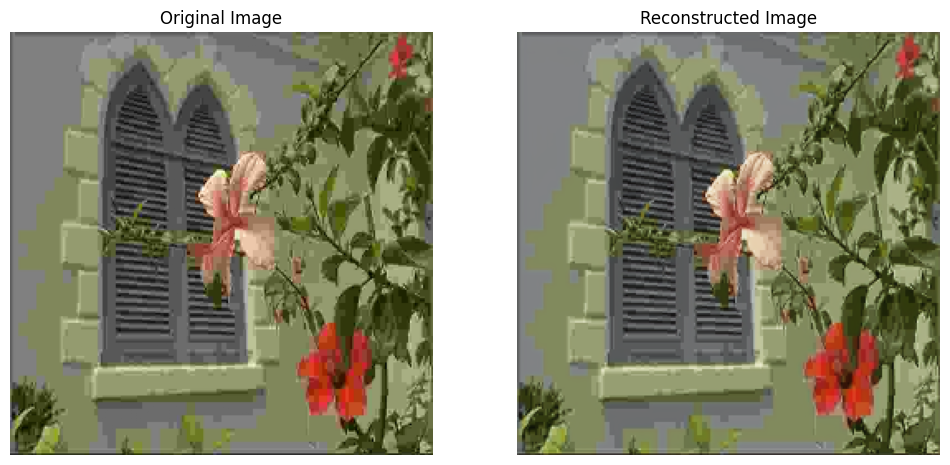

PSNR: 36.22 dB
MSSIM: 0.9901


In [ ]:
#Image Comparision
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim  # Import SSIM function

# ---------------------------
# Helper Function: Load and Preprocess a Single Image
# ---------------------------
def load_and_preprocess_image(image_path, target_size=(256, 256)):

    # Read image using OpenCV (reads as BGR)
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError("Image not found or unable to load: " + image_path)

    # Convert from BGR to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Resize image
    img = cv2.resize(img, target_size)
    # Normalize to [0,1]
    img = img.astype('float32') / 255.0

    return img

# ---------------------------
# PSNR Calculation Function
# ---------------------------
def calculate_psnr(original, reconstructed):
    mse = np.mean((original - reconstructed) ** 2)
    if mse == 0:
        return 100  # Return a high PSNR if no error
    max_pixel = 1.0  # Since images are normalized to [0,1]
    psnr = 10 * np.log10((max_pixel ** 2) / mse)
    return psnr

# ---------------------------
# MSSIM Calculation Function
# ---------------------------
def calculate_mssim(original, reconstructed):

    mssim_value = ssim(original, reconstructed, channel_axis=-1, data_range=1.0)
    return mssim_value


# ---------------------------
# Paths for the Single Image
# ---------------------------

single_image_path = '/content/drive/My Drive/Colab Notebooks/KODAK/Compressed_BitRate/Kodim07_Bit_rate_0.21/compressed_kodim07.jpg'  # Provide your single image path here
compressed_image_path = '/content/drive/My Drive/Colab Notebooks/KODAK/Output/compressed_image.jpg'  # Path to store compressed image


# ---------------------------
# Load and Preprocess the Single Image
# ---------------------------
single_image = load_and_preprocess_image(single_image_path, target_size=(256, 256))

# ---------------------------
# Pass the Image through the Autoencoder
# ---------------------------
# Expand dims to create a batch (model.predict expects a batch dimension)
single_image_batch = np.expand_dims(single_image, axis=0)

# Predict the reconstruction using your autoencoder
# (Ensure that your autoencoder model is already defined and loaded)
reconstructed_batch = autoencoder.predict(single_image_batch)
# Remove the batch dimension to get a single image
reconstructed_image = reconstructed_batch[0]

# ---------------------------
# Save the Reconstructed Image for BPP Calculation
# ---------------------------
cv2.imwrite(compressed_image_path, (reconstructed_image * 255).astype(np.uint8))

# ---------------------------
# Calculate PSNR, MSSIM, and BPP
# ---------------------------
psnr_value = calculate_psnr(single_image, reconstructed_image)
mssim_value = calculate_mssim(single_image, reconstructed_image)


# ---------------------------
# Display the Original and Reconstructed Images Side by Side
# ---------------------------
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(single_image)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image)
plt.title("Reconstructed Image")
plt.axis("off")
plt.show()

# Print PSNR, MSSIM, and BPP values
print(f"PSNR: {psnr_value:.2f} dB")
print(f"MSSIM: {mssim_value:.4f}")

